In [1]:
import os
import json
import torch
import matplotlib.pyplot as plt
import torch.optim as optim
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
import segmentation_models_pytorch as smp

from sateImageDataset import get_datasets
from models import DeepLabV3Plus, UNet, MaNet, Encoder
from logger import Logger
from metrics import Metrics

torch.manual_seed(42)
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

In [2]:
BATCH_SIZE = 32 #FIXED
LEARNING_RATE = 0.0001
EPOCH = 50 #FIXED
PATIENCE = 3 #FIXED
FACTOR = 0.1 #FIXED
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
TEST_K = 5

In [3]:
train_dataset, val_dataset, test_dataset = get_datasets(TEST_K)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=os.cpu_count())
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=os.cpu_count())
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=os.cpu_count())

In [4]:
model = DeepLabV3Plus(Encoder.RESNET50).to(DEVICE)

loss_fn = nn.BCELoss()

optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=PATIENCE, factor=FACTOR)
metrics = Metrics()

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.1636199951171875, 'precision': 0.1636199951171875, 'recall': 1.0, 'f1score': 0.2812258303165436}


C:\Users\aakas\anaconda3\Lib\site-packages\torch\nn\modules\conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ..\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


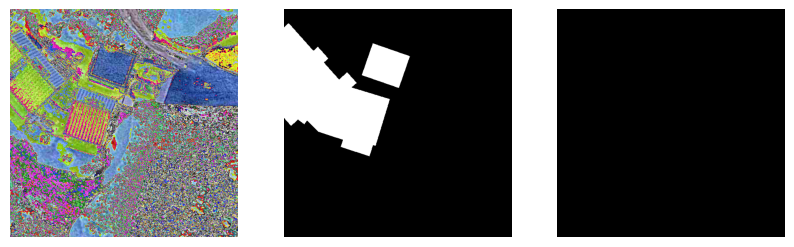

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.13584518432617188, 'precision': 0.13584518432617188, 'recall': 1.0, 'f1score': 0.23919665813446045}


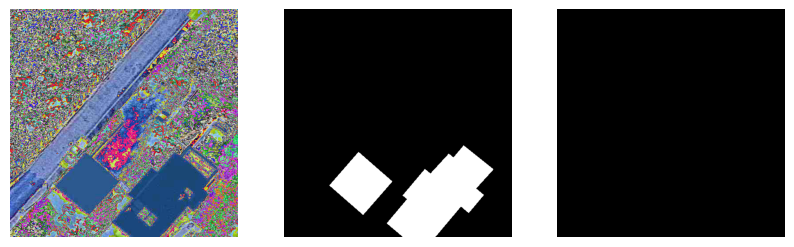

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.12152862548828125, 'precision': 0.12152862548828125, 'recall': 1.0, 'f1score': 0.2167196124792099}


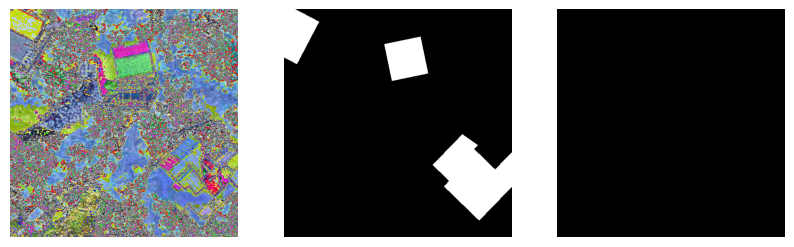

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.24312591552734375, 'precision': 0.24312591552734375, 'recall': 1.0, 'f1score': 0.3911525309085846}


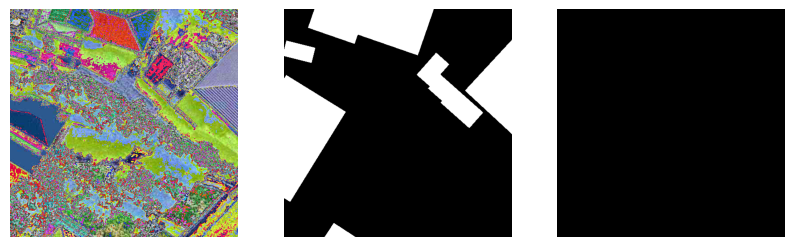

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.022487640380859375, 'precision': 0.022487640380859375, 'recall': 1.0, 'f1score': 0.043986137956380844}


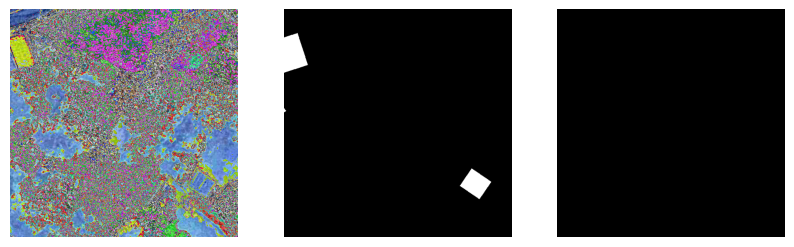

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.14397048950195312, 'precision': 0.14397048950195312, 'recall': 1.0, 'f1score': 0.251703143119812}


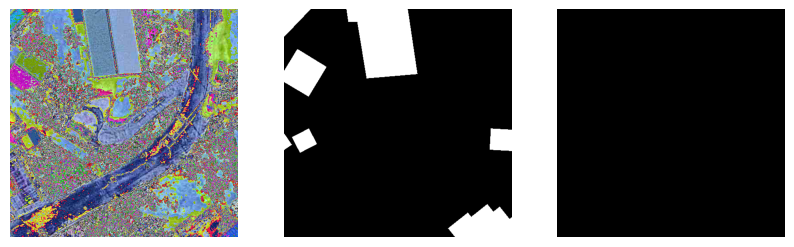

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.2105865478515625, 'precision': 0.2105865478515625, 'recall': 1.0, 'f1score': 0.34790828824043274}


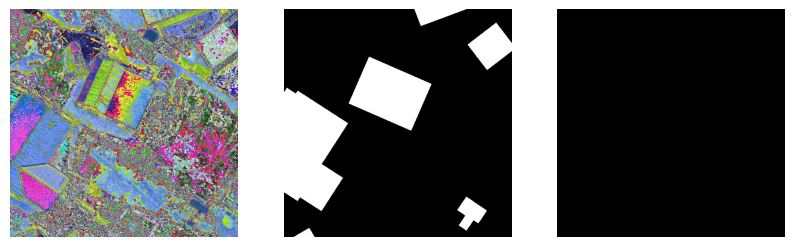

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.2453155517578125, 'precision': 0.2453155517578125, 'recall': 1.0, 'f1score': 0.39398133754730225}


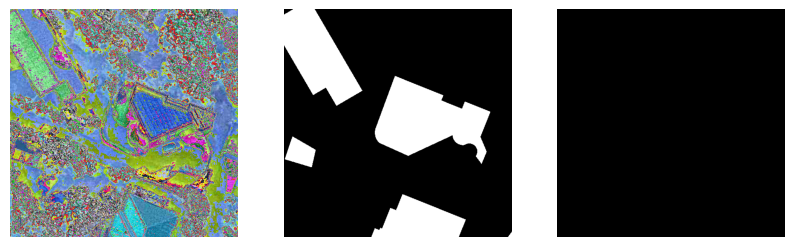

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.000690460205078125, 'precision': 0.000690460205078125, 'recall': 1.0, 'f1score': 0.0013799675507470965}


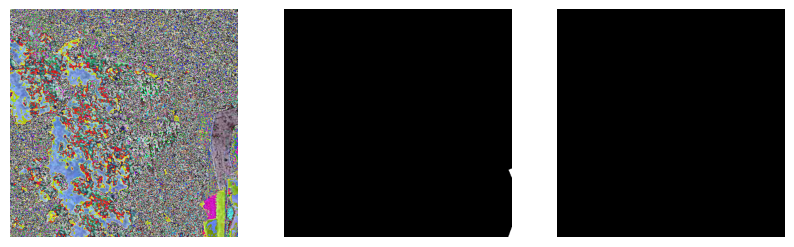

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.15084457397460938, 'precision': 0.15084457397460938, 'recall': 1.0, 'f1score': 0.26214587688446045}


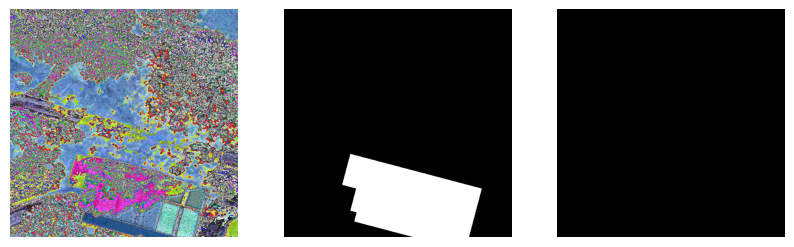

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.17764663696289062, 'precision': 0.17764663696289062, 'recall': 1.0, 'f1score': 0.301697701215744}


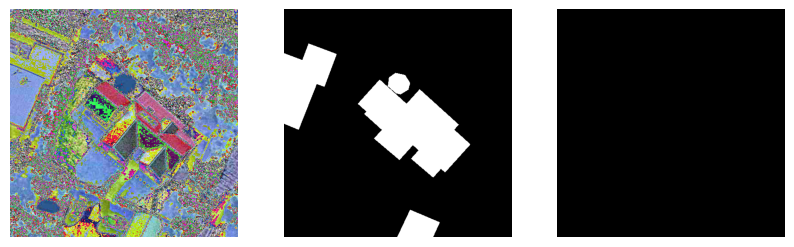

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.032726287841796875, 'precision': 0.032726287841796875, 'recall': 1.0, 'f1score': 0.06337843835353851}


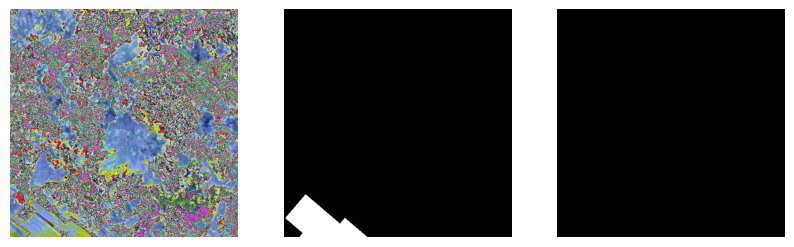

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.014629364013671875, 'precision': 0.014629364013671875, 'recall': 1.0, 'f1score': 0.028836863115429878}


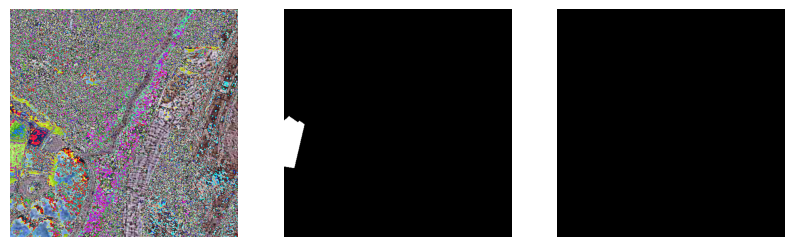

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.000274658203125, 'precision': 0.000274658203125, 'recall': 1.0, 'f1score': 0.0005491655902005732}


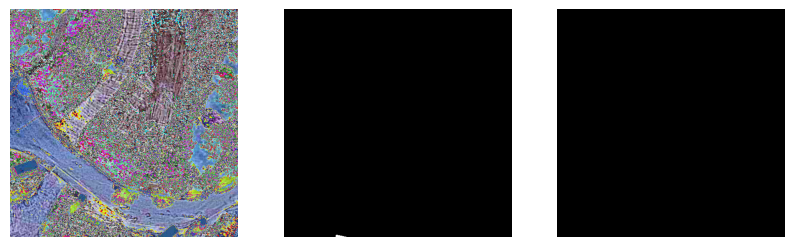

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.06411361694335938, 'precision': 0.06411361694335938, 'recall': 1.0, 'f1score': 0.12050145119428635}


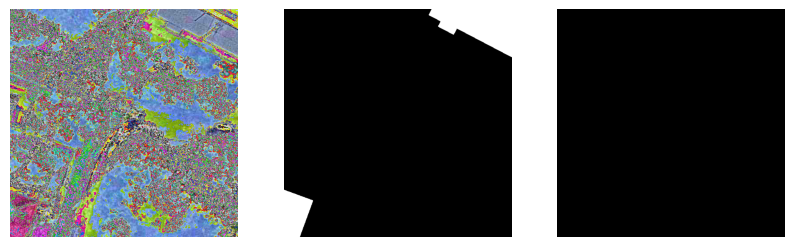

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.24341583251953125, 'precision': 0.24341583251953125, 'recall': 1.0, 'f1score': 0.3915276527404785}


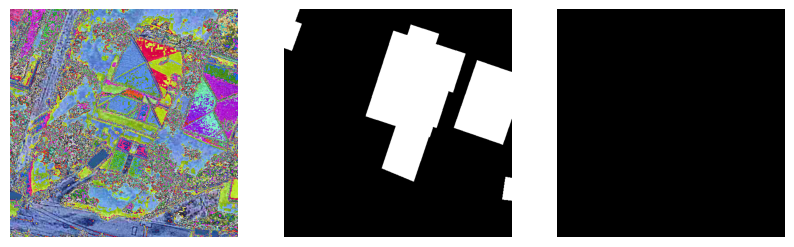

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.20524215698242188, 'precision': 0.20524215698242188, 'recall': 1.0, 'f1score': 0.3405824303627014}


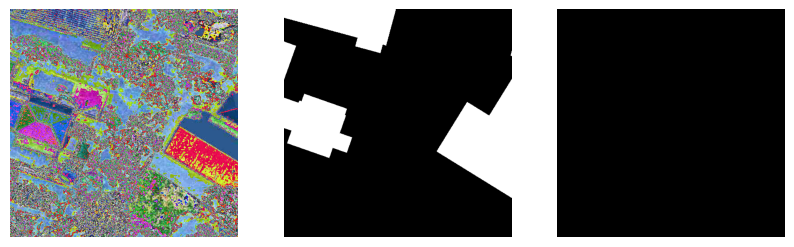

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.2613945007324219, 'precision': 0.2613945007324219, 'recall': 1.0, 'f1score': 0.4144532084465027}


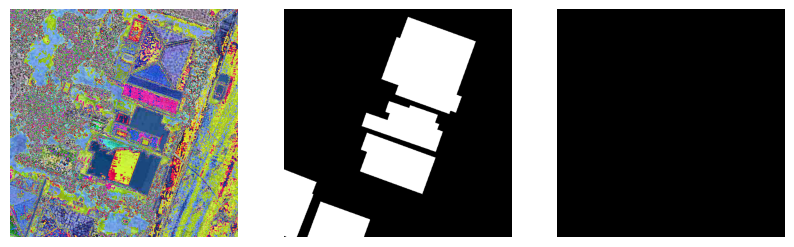

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.09475326538085938, 'precision': 0.09475326538085938, 'recall': 1.0, 'f1score': 0.17310433089733124}


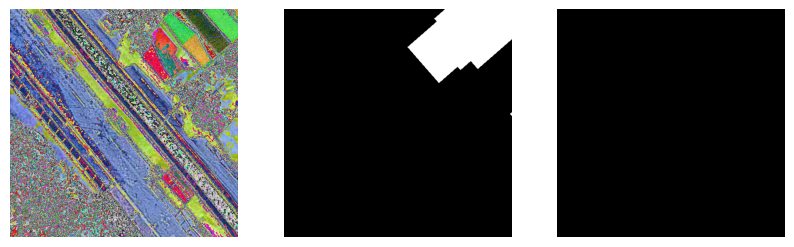

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.5622787475585938, 'precision': 0.5622787475585938, 'recall': 1.0, 'f1score': 0.7198187112808228}


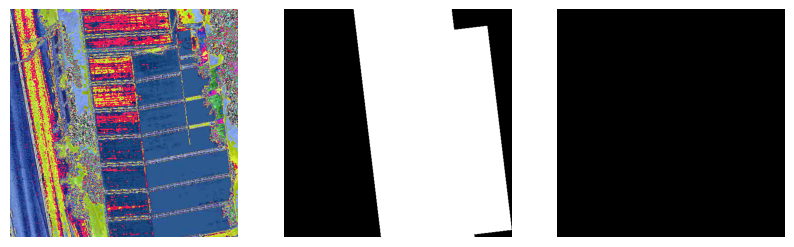

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.4537391662597656, 'precision': 0.4537391662597656, 'recall': 1.0, 'f1score': 0.6242373585700989}


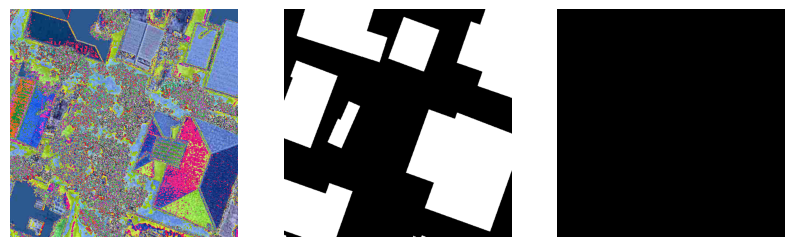

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.047016143798828125, 'precision': 0.047016143798828125, 'recall': 1.0, 'f1score': 0.08980977535247803}


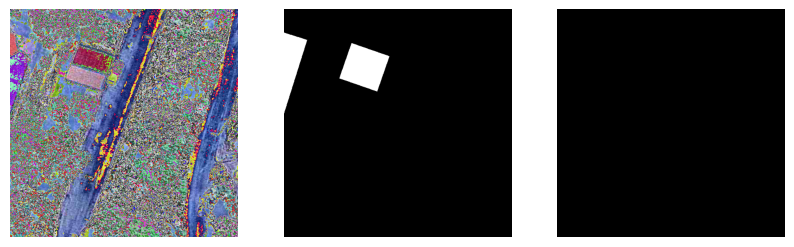

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.09174728393554688, 'precision': 0.09174728393554688, 'recall': 1.0, 'f1score': 0.16807422041893005}


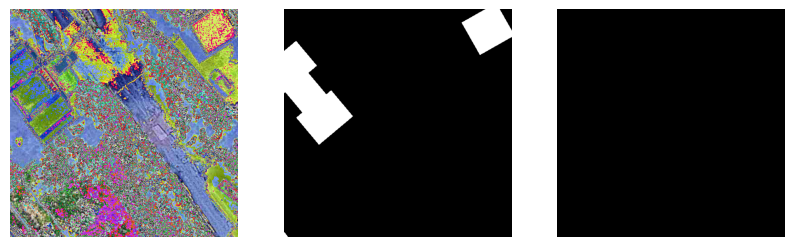

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.0304718017578125, 'precision': 0.0304718017578125, 'recall': 1.0, 'f1score': 0.059141457080841064}


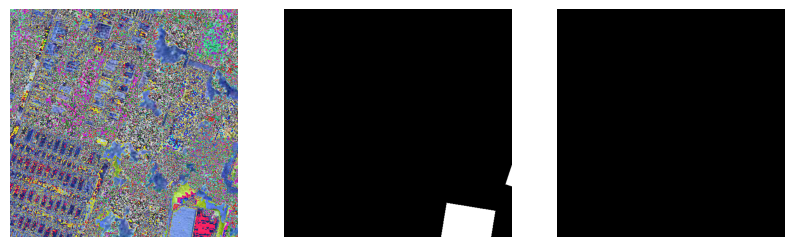

Background: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}
Building: {'iou': 0.15847396850585938, 'precision': 0.15847396850585938, 'recall': 1.0, 'f1score': 0.27359089255332947}


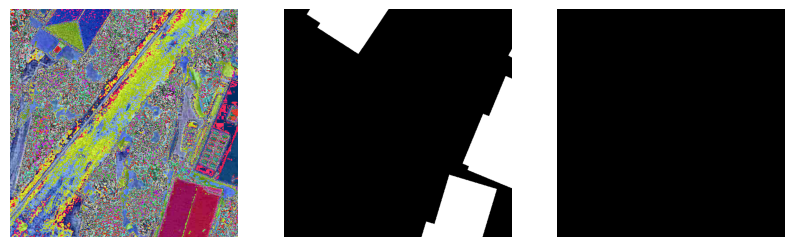

In [5]:
model.eval()
with torch.no_grad():
    for i in range(25):
        X, Y = test_dataset.__getitem__(i)
        X, Y = X.to(DEVICE).unsqueeze(0), Y.to(DEVICE).unsqueeze(0)
        
        pred = model(X)
        
        m = metrics(pred, Y.to(torch.long))
        
        print("=========================================================")
        print(f"Background: {m['background']}")
        print(f"Building: {m['building']}")
        
        _, ax = plt.subplots(1, 3, figsize=(10, 5))
        
        ax[0].imshow(transforms.ToPILImage()(X[0]))
        ax[1].imshow(transforms.ToPILImage()(Y.argmax(dim=1).float()), cmap="gray")
        ax[2].imshow(transforms.ToPILImage()(pred.argmax(dim=1).float()), cmap="gray")
        
        ax[0].axis("off")
        ax[1].axis("off")
        ax[2].axis("off")
        
        plt.show()

In [6]:
logger = Logger(model.architecture, model.backbone + f"_K_{str(TEST_K)}")
logger.log(f"Loss Function: BCELoss")
logger.log(f"Optimizer: {str(optimizer)}")
logger.log(f"Schedular: {str(scheduler)}")
logger.log(f"Patience: {PATIENCE}")
logger.log(f"Factor: {FACTOR}")
logger.log(f"Learning Rate: {LEARNING_RATE}")
logger.log(f"Batch Size: {BATCH_SIZE}")
logger.log(f"Max Epoch: {EPOCH}")
logger.log(f"Device: {DEVICE}")
logger.log(f"Test K: {TEST_K}")
logger.log(f"Train: {len(train_dataset)}, Validation: {len(val_dataset)}, Test: {len(test_dataset)}")
logger.log("")
logger.log("Starting Training")
logger.log("")

In [7]:
VAL_LOSS_PRECISION = 0.00001
VAL_LOSS_MIN = 10e10
BEST_MODEL_EPOCH = 0

logs = {
    "lr": [],
    "train": {
        "loss": [],
        "background": {
            "iou": [],
            "precision": [],
            "recall": [],
            "f1score": []
        },
        "building": {
            "iou": [],
            "precision": [],
            "recall": [],
            "f1score": []
        }
    },
     "validation": {
        "loss": [],
        "background": {
            "iou": [],
            "precision": [],
            "recall": [],
            "f1score": []
        },
        "building": {
            "iou": [],
            "precision": [],
            "recall": [],
            "f1score": []
        }
    }
}

In [8]:
for e in range(EPOCH):
    
    logger.log(f"[{e+1}/{EPOCH}]")
    print(f"[{e+1}/{EPOCH}]")
    
    logs["lr"].append(scheduler.optimizer.param_groups[0]['lr'])
    logger.log(f"  lr={scheduler.optimizer.param_groups[0]['lr']}")
    print(f"  lr={scheduler.optimizer.param_groups[0]['lr']}")
    
    logger.log("  [TRAIN]")
    model.train()
    running_items = 0
    running_loss = 0
    running_metrics = {
        "background": {
            "iou": 0,
            "precision": 0,
            "recall": 0,
            "f1score": 0
        },
        "building": {
            "iou": 0,
            "precision": 0,
            "recall": 0,
            "f1score": 0
        }
    }
    for X, Y in tqdm(train_loader):
        X, Y = X.to(DEVICE), Y.to(DEVICE)

        optimizer.zero_grad()

        pred = model(X)
        
        loss = loss_fn(pred, Y)
        loss.backward()
        optimizer.step()
        
        m = metrics(pred, Y.to(torch.long))
        running_items += m["batch_size"]
        running_loss += loss.item()
        for key, value in m["background"].items():
            running_metrics["background"][key] += value
            
        for key, value in m["building"].items():
            running_metrics["building"][key] += value
    
    
    logs["train"]["loss"].append(running_loss / running_items)
    logger.log(f"    Loss: {running_loss / running_items}")
    
    for key, value in running_metrics["background"].items():
        logs["train"]["background"][key].append(value / running_items)
        logger.log(f"    Background {key}: {value / running_items}")
        
    for key, value in running_metrics["building"].items():
        logs["train"]["building"][key].append(value / running_items)
        logger.log(f"    Building {key}: {value / running_items}")
        
    print(f'  [TRAIN] Loss: {running_loss / running_items:.6f}, mIoU(Buidling): {running_metrics["building"]["iou"] / running_items:.4f}')
    
    logger.log("  [VALIDATION]")
    model.eval()
    running_items = 0
    running_loss = 0
    running_metrics = {
        "background": {
            "iou": 0,
            "precision": 0,
            "recall": 0,
            "f1score": 0
        },
        "building": {
            "iou": 0,
            "precision": 0,
            "recall": 0,
            "f1score": 0
        }
    }
    with torch.no_grad():
        for X, Y in tqdm(val_loader):
            X, Y = X.to(DEVICE), Y.to(DEVICE)
            
            pred = model(X)
        
            loss = loss_fn(pred, Y)
            
            m = metrics(pred, Y.to(torch.long))
            running_items += m["batch_size"]
            running_loss += loss.item()
            for key, value in m["background"].items():
                running_metrics["background"][key] += value

            for key, value in m["building"].items():
                running_metrics["building"][key] += value
            
    
    scheduler.step(running_loss / running_items)
    
    logs["validation"]["loss"].append(running_loss / running_items)
    logger.log(f"    Loss: {running_loss / running_items}")
    
    for key, value in running_metrics["background"].items():
        logs["validation"]["background"][key].append(value / running_items)
        logger.log(f"    Background {key}: {value / running_items}")
        
    for key, value in running_metrics["building"].items():
        logs["validation"]["building"][key].append(value / running_items)
        logger.log(f"    Building {key}: {value / running_items}")
        
    print(f'  [VALIDATION] Loss: {running_loss / running_items:.6f}, mIoU(Buidling): {running_metrics["building"]["iou"] / running_items:.4f}')
    
    torch.save({
        'epoch': e+1,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
    }, os.path.join(logger.folder, f"model_{e+1}.pt"))
    
    if running_loss / running_items < VAL_LOSS_MIN:
        VAL_LOSS_MIN = running_loss / running_items
        BEST_MODEL_EPOCH = e+1
    
    
    if len(logs["validation"]["loss"]) >= 10:
        last_10 = logs["validation"]["loss"][-10:]
        if abs(max(last_10) - min(last_10)) < VAL_LOSS_PRECISION:
            logger.log(f"Early Stop")
            break 

logger.log(f"Best Epoch: {BEST_MODEL_EPOCH}")

[1/50]
  lr=0.0001


100%|██████████| 2250/2250 [43:06<00:00,  1.15s/it]


  [TRAIN] Loss: 0.004985, mIoU(Buidling): 0.6779


100%|██████████| 250/250 [04:27<00:00,  1.07s/it]


  [VALIDATION] Loss: 0.003868, mIoU(Buidling): 0.7333
[2/50]
  lr=0.0001


100%|██████████| 2250/2250 [46:32<00:00,  1.24s/it]


  [TRAIN] Loss: 0.003815, mIoU(Buidling): 0.7340


100%|██████████| 250/250 [04:25<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.003479, mIoU(Buidling): 0.7468
[3/50]
  lr=0.0001


100%|██████████| 2250/2250 [46:56<00:00,  1.25s/it]


  [TRAIN] Loss: 0.003537, mIoU(Buidling): 0.7497


100%|██████████| 250/250 [04:30<00:00,  1.08s/it]


  [VALIDATION] Loss: 0.003293, mIoU(Buidling): 0.7666
[4/50]
  lr=0.0001


100%|██████████| 2250/2250 [46:38<00:00,  1.24s/it]


  [TRAIN] Loss: 0.003349, mIoU(Buidling): 0.7597


100%|██████████| 250/250 [04:26<00:00,  1.07s/it]


  [VALIDATION] Loss: 0.003119, mIoU(Buidling): 0.7715
[5/50]
  lr=0.0001


100%|██████████| 2250/2250 [46:23<00:00,  1.24s/it]


  [TRAIN] Loss: 0.003216, mIoU(Buidling): 0.7671


100%|██████████| 250/250 [04:24<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.003055, mIoU(Buidling): 0.7763
[6/50]
  lr=0.0001


100%|██████████| 2250/2250 [46:02<00:00,  1.23s/it]


  [TRAIN] Loss: 0.003129, mIoU(Buidling): 0.7723


100%|██████████| 250/250 [04:23<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002957, mIoU(Buidling): 0.7799
[7/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:46<00:00,  1.22s/it]


  [TRAIN] Loss: 0.003064, mIoU(Buidling): 0.7748


100%|██████████| 250/250 [04:21<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.003026, mIoU(Buidling): 0.7801
[8/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:43<00:00,  1.22s/it]


  [TRAIN] Loss: 0.003012, mIoU(Buidling): 0.7772


100%|██████████| 250/250 [04:21<00:00,  1.04s/it]


  [VALIDATION] Loss: 0.002900, mIoU(Buidling): 0.7868
[9/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:35<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002971, mIoU(Buidling): 0.7792


100%|██████████| 250/250 [04:20<00:00,  1.04s/it]


  [VALIDATION] Loss: 0.002866, mIoU(Buidling): 0.7876
[10/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:34<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002935, mIoU(Buidling): 0.7813


100%|██████████| 250/250 [04:22<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002854, mIoU(Buidling): 0.7898
[11/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:42<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002889, mIoU(Buidling): 0.7837


100%|██████████| 250/250 [04:23<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002835, mIoU(Buidling): 0.7877
[12/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:35<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002855, mIoU(Buidling): 0.7846


100%|██████████| 250/250 [04:22<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002816, mIoU(Buidling): 0.7904
[13/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:39<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002848, mIoU(Buidling): 0.7853


100%|██████████| 250/250 [04:20<00:00,  1.04s/it]


  [VALIDATION] Loss: 0.002778, mIoU(Buidling): 0.7941
[14/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:39<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002814, mIoU(Buidling): 0.7880


100%|██████████| 250/250 [04:19<00:00,  1.04s/it]


  [VALIDATION] Loss: 0.002753, mIoU(Buidling): 0.7951
[15/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:35<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002779, mIoU(Buidling): 0.7889


100%|██████████| 250/250 [04:20<00:00,  1.04s/it]


  [VALIDATION] Loss: 0.002739, mIoU(Buidling): 0.7938
[16/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:24<00:00,  1.21s/it]


  [TRAIN] Loss: 0.002764, mIoU(Buidling): 0.7887


100%|██████████| 250/250 [04:23<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002733, mIoU(Buidling): 0.7957
[17/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:41<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002733, mIoU(Buidling): 0.7914


100%|██████████| 250/250 [04:21<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002716, mIoU(Buidling): 0.7960
[18/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:44<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002717, mIoU(Buidling): 0.7921


100%|██████████| 250/250 [04:22<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002696, mIoU(Buidling): 0.7989
[19/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:40<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002713, mIoU(Buidling): 0.7919


100%|██████████| 250/250 [04:23<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002674, mIoU(Buidling): 0.8005
[20/50]
  lr=0.0001


100%|██████████| 2250/2250 [46:08<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002675, mIoU(Buidling): 0.7945


100%|██████████| 250/250 [04:22<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002657, mIoU(Buidling): 0.8014
[21/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:52<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002678, mIoU(Buidling): 0.7939


100%|██████████| 250/250 [04:21<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002663, mIoU(Buidling): 0.7998
[22/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:55<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002649, mIoU(Buidling): 0.7947


100%|██████████| 250/250 [04:23<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002675, mIoU(Buidling): 0.8000
[23/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:51<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002650, mIoU(Buidling): 0.7955


100%|██████████| 250/250 [04:23<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002651, mIoU(Buidling): 0.7986
[24/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:46<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002650, mIoU(Buidling): 0.7949


100%|██████████| 250/250 [04:22<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002691, mIoU(Buidling): 0.7988
[25/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:48<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002622, mIoU(Buidling): 0.7964


100%|██████████| 250/250 [04:23<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.002624, mIoU(Buidling): 0.8006
[26/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:48<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002614, mIoU(Buidling): 0.7966


100%|██████████| 250/250 [04:23<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002630, mIoU(Buidling): 0.8027
[27/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:49<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002608, mIoU(Buidling): 0.7970


100%|██████████| 250/250 [04:24<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.002635, mIoU(Buidling): 0.8033
[28/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:46<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002604, mIoU(Buidling): 0.7983


100%|██████████| 250/250 [04:24<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.002638, mIoU(Buidling): 0.8008
[29/50]
  lr=0.0001


100%|██████████| 2250/2250 [45:41<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002616, mIoU(Buidling): 0.7967


100%|██████████| 250/250 [04:21<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002816, mIoU(Buidling): 0.7864
[30/50]
  lr=1e-05


100%|██████████| 2250/2250 [45:47<00:00,  1.22s/it]


  [TRAIN] Loss: 0.002671, mIoU(Buidling): 0.7915


100%|██████████| 250/250 [04:26<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.002662, mIoU(Buidling): 0.7994
[31/50]
  lr=1e-05


100%|██████████| 2250/2250 [46:02<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002618, mIoU(Buidling): 0.7954


100%|██████████| 250/250 [04:23<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.002633, mIoU(Buidling): 0.7990
[32/50]
  lr=1e-05


100%|██████████| 2250/2250 [46:18<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002598, mIoU(Buidling): 0.7962


100%|██████████| 250/250 [04:27<00:00,  1.07s/it]


  [VALIDATION] Loss: 0.002622, mIoU(Buidling): 0.7998
[33/50]
  lr=1e-05


100%|██████████| 2250/2250 [46:24<00:00,  1.24s/it]


  [TRAIN] Loss: 0.002592, mIoU(Buidling): 0.7974


100%|██████████| 250/250 [04:26<00:00,  1.07s/it]


  [VALIDATION] Loss: 0.002619, mIoU(Buidling): 0.8018
[34/50]
  lr=1e-05


100%|██████████| 2250/2250 [46:31<00:00,  1.24s/it]


  [TRAIN] Loss: 0.002580, mIoU(Buidling): 0.7979


100%|██████████| 250/250 [04:26<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.002608, mIoU(Buidling): 0.8038
[35/50]
  lr=1e-05


100%|██████████| 2250/2250 [46:08<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002568, mIoU(Buidling): 0.7992


100%|██████████| 250/250 [04:25<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.002592, mIoU(Buidling): 0.8043
[36/50]
  lr=1e-05


100%|██████████| 2250/2250 [46:03<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002565, mIoU(Buidling): 0.7990


100%|██████████| 250/250 [04:23<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.002602, mIoU(Buidling): 0.8048
[37/50]
  lr=1e-05


100%|██████████| 2250/2250 [46:07<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002551, mIoU(Buidling): 0.8001


100%|██████████| 250/250 [04:23<00:00,  1.05s/it]


  [VALIDATION] Loss: 0.002593, mIoU(Buidling): 0.8034
[38/50]
  lr=1e-05


100%|██████████| 2250/2250 [46:02<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002545, mIoU(Buidling): 0.8011


100%|██████████| 250/250 [04:25<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.002597, mIoU(Buidling): 0.8010
[39/50]
  lr=1e-05


100%|██████████| 2250/2250 [46:06<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002544, mIoU(Buidling): 0.8002


100%|██████████| 250/250 [04:24<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.002597, mIoU(Buidling): 0.8008
[40/50]
  lr=1.0000000000000002e-06


100%|██████████| 2250/2250 [46:12<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002543, mIoU(Buidling): 0.8012


100%|██████████| 250/250 [04:29<00:00,  1.08s/it]


  [VALIDATION] Loss: 0.002572, mIoU(Buidling): 0.8052
[41/50]
  lr=1.0000000000000002e-06


100%|██████████| 2250/2250 [46:21<00:00,  1.24s/it]


  [TRAIN] Loss: 0.002541, mIoU(Buidling): 0.8003


100%|██████████| 250/250 [04:25<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.002577, mIoU(Buidling): 0.8036
[42/50]
  lr=1.0000000000000002e-06


100%|██████████| 2250/2250 [46:28<00:00,  1.24s/it]


  [TRAIN] Loss: 0.002541, mIoU(Buidling): 0.8015


100%|██████████| 250/250 [04:26<00:00,  1.07s/it]


  [VALIDATION] Loss: 0.002573, mIoU(Buidling): 0.8067
[43/50]
  lr=1.0000000000000002e-06


100%|██████████| 2250/2250 [46:25<00:00,  1.24s/it]


  [TRAIN] Loss: 0.002538, mIoU(Buidling): 0.7997


100%|██████████| 250/250 [04:27<00:00,  1.07s/it]


  [VALIDATION] Loss: 0.002588, mIoU(Buidling): 0.8042
[44/50]
  lr=1.0000000000000002e-06


100%|██████████| 2250/2250 [46:32<00:00,  1.24s/it]


  [TRAIN] Loss: 0.002540, mIoU(Buidling): 0.8002


100%|██████████| 250/250 [04:29<00:00,  1.08s/it]


  [VALIDATION] Loss: 0.002596, mIoU(Buidling): 0.8039
[45/50]
  lr=1.0000000000000002e-07


100%|██████████| 2250/2250 [46:21<00:00,  1.24s/it]


  [TRAIN] Loss: 0.002540, mIoU(Buidling): 0.8001


100%|██████████| 250/250 [04:28<00:00,  1.07s/it]


  [VALIDATION] Loss: 0.002594, mIoU(Buidling): 0.8059
[46/50]
  lr=1.0000000000000002e-07


100%|██████████| 2250/2250 [46:16<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002546, mIoU(Buidling): 0.8002


100%|██████████| 250/250 [04:25<00:00,  1.06s/it]


  [VALIDATION] Loss: 0.002589, mIoU(Buidling): 0.8048
[47/50]
  lr=1.0000000000000002e-07


100%|██████████| 2250/2250 [46:15<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002544, mIoU(Buidling): 0.8002


100%|██████████| 250/250 [04:28<00:00,  1.07s/it]


  [VALIDATION] Loss: 0.002592, mIoU(Buidling): 0.8058
[48/50]
  lr=1.0000000000000002e-07


100%|██████████| 2250/2250 [46:16<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002547, mIoU(Buidling): 0.8000


100%|██████████| 250/250 [04:28<00:00,  1.07s/it]


  [VALIDATION] Loss: 0.002592, mIoU(Buidling): 0.8041
[49/50]
  lr=1.0000000000000004e-08


100%|██████████| 2250/2250 [46:12<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002538, mIoU(Buidling): 0.8006


100%|██████████| 250/250 [04:27<00:00,  1.07s/it]


  [VALIDATION] Loss: 0.002605, mIoU(Buidling): 0.8043
[50/50]
  lr=1.0000000000000004e-08


100%|██████████| 2250/2250 [46:11<00:00,  1.23s/it]


  [TRAIN] Loss: 0.002543, mIoU(Buidling): 0.8005


100%|██████████| 250/250 [04:26<00:00,  1.07s/it]


  [VALIDATION] Loss: 0.002585, mIoU(Buidling): 0.8032


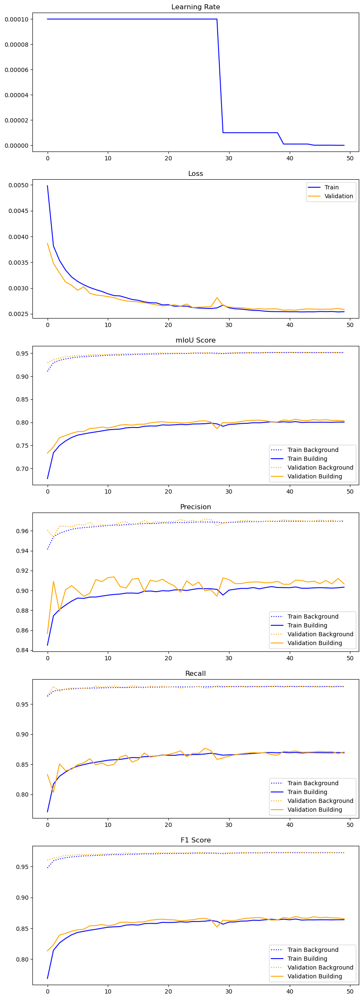

In [9]:
fig, ax = plt.subplots(6, 1, figsize=(10, 30))

# Learning Rate --------------------------------------------------------------------------------------------------
ax[0].plot(
    list(range(len(logs["lr"]))),
    logs["lr"],
    color="blue"
    
)
ax[0].set_title("Learning Rate")

# Loss -----------------------------------------------------------------------------------------------------------
ax[1].plot(
    list(range(len(logs["train"]["loss"]))),
    logs["train"]["loss"],
    label="Train",
    color="blue"
)
ax[1].plot(
    list(range(len(logs["validation"]["loss"]))),
    logs["validation"]["loss"],
    label="Validation",
    color="orange"
)
ax[1].legend()
ax[1].set_title("Loss")

# IoU Score ------------------------------------------------------------------------------------------------------
ax[2].plot(
    list(range(len(logs["train"]["background"]["iou"]))),
    logs["train"]["background"]["iou"],
    label="Train Background",
    color="blue",
    linestyle='dotted'
)
ax[2].plot(
    list(range(len(logs["train"]["building"]["iou"]))),
    logs["train"]["building"]["iou"],
    label="Train Building",
    color="blue",
)
ax[2].plot(
    list(range(len(logs["validation"]["background"]["iou"]))),
    logs["validation"]["background"]["iou"],
    label="Validation Background",
    color="orange",
    linestyle='dotted'
)
ax[2].plot(
    list(range(len(logs["validation"]["building"]["iou"]))),
    logs["validation"]["building"]["iou"],
    label="Validation Building",
    color="orange",
)
ax[2].legend()
ax[2].set_title("mIoU Score")

# Precision ------------------------------------------------------------------------------------------------------
ax[3].plot(
    list(range(len(logs["train"]["background"]["precision"]))),
    logs["train"]["background"]["precision"],
    label="Train Background",
    color="blue",
    linestyle='dotted'
)
ax[3].plot(
    list(range(len(logs["train"]["building"]["precision"]))),
    logs["train"]["building"]["precision"],
    label="Train Building",
    color="blue",
)
ax[3].plot(
    list(range(len(logs["validation"]["background"]["precision"]))),
    logs["validation"]["background"]["precision"],
    label="Validation Background",
    color="orange",
    linestyle='dotted'
)
ax[3].plot(
    list(range(len(logs["validation"]["building"]["precision"]))),
    logs["validation"]["building"]["precision"],
    label="Validation Building",
    color="orange",
)
ax[3].legend()
ax[3].set_title("Precision")

# Recall -----------------------------------------------------------------------------------------------------------
ax[4].plot(
    list(range(len(logs["train"]["background"]["recall"]))),
    logs["train"]["background"]["recall"],
    label="Train Background",
    color="blue",
    linestyle='dotted'
)
ax[4].plot(
    list(range(len(logs["train"]["building"]["recall"]))),
    logs["train"]["building"]["recall"],
    label="Train Building",
    color="blue",
)
ax[4].plot(
    list(range(len(logs["validation"]["background"]["recall"]))),
    logs["validation"]["background"]["recall"],
    label="Validation Background",
    color="orange",
    linestyle='dotted'
)
ax[4].plot(
    list(range(len(logs["validation"]["building"]["recall"]))),
    logs["validation"]["building"]["recall"],
    label="Validation Building",
    color="orange",
)
ax[4].legend()
ax[4].set_title("Recall")

# F1-Score --------------------------------------------------------------------------------------------------------
ax[5].plot(
    list(range(len(logs["train"]["background"]["f1score"]))),
    logs["train"]["background"]["f1score"],
    label="Train Background",
    color="blue",
    linestyle='dotted'
)
ax[5].plot(
    list(range(len(logs["train"]["building"]["f1score"]))),
    logs["train"]["building"]["f1score"],
    label="Train Building",
    color="blue",
)
ax[5].plot(
    list(range(len(logs["validation"]["background"]["f1score"]))),
    logs["validation"]["background"]["f1score"],
    label="Validation Background",
    color="orange",
    linestyle='dotted'
)
ax[5].plot(
    list(range(len(logs["validation"]["building"]["f1score"]))),
    logs["validation"]["building"]["f1score"],
    label="Validation Building",
    color="orange",
)
ax[5].legend()
ax[5].set_title("F1 Score")

fig.savefig(os.path.join(logger.folder, "training_results.svg"))
fig.savefig(os.path.join(logger.folder, "training_results.png"))
plt.show()

In [10]:
logger.log(f"Best Epoch: {BEST_MODEL_EPOCH}")
print(f"Best Epoch: {BEST_MODEL_EPOCH}")
checkpoint = torch.load(os.path.join(logger.folder, f"model_{BEST_MODEL_EPOCH}.pt"))
model.load_state_dict(checkpoint['model_state_dict'])

Best Epoch: 40


<All keys matched successfully>

In [11]:
model.eval()
running_items = 0
running_loss = 0
running_metrics = {
    "background": {
        "iou": 0,
        "precision": 0,
        "recall": 0,
        "f1score": 0
    },
    "building": {
        "iou": 0,
        "precision": 0,
        "recall": 0,
        "f1score": 0
    }
}
with torch.no_grad():
    for X, Y in tqdm(test_loader):
        X, Y = X.to(DEVICE), Y.to(DEVICE)

        pred = model(X)

        loss = loss_fn(pred, Y)

        m = metrics(pred, Y.to(torch.long))
        running_items += m["batch_size"]
        running_loss += loss.item()
        for key, value in m["background"].items():
            running_metrics["background"][key] += value

        for key, value in m["building"].items():
            running_metrics["building"][key] += value
        
        
for key, value in m["background"].items():
    running_metrics["background"][key] = running_metrics["background"][key] / running_items

for key, value in m["building"].items():
    running_metrics["building"][key] = running_metrics["building"][key] / running_items
    
logs["test"] = running_metrics
logs["test"]["loss"] = running_loss / running_items

with open(os.path.join(logger.folder, "raw_data.json"), "w") as file:
    json.dump(logs, file, indent=4)

100%|██████████| 625/625 [1:26:01<00:00,  8.26s/it]


Background: {'iou': 0.969537615776062, 'precision': 0.9746114015579224, 'recall': 0.9946591258049011, 'f1score': 0.9845331907272339}
Building: {'iou': 0.8444953560829163, 'precision': 0.9694908857345581, 'recall': 0.8675510287284851, 'f1score': 0.9156925678253174}


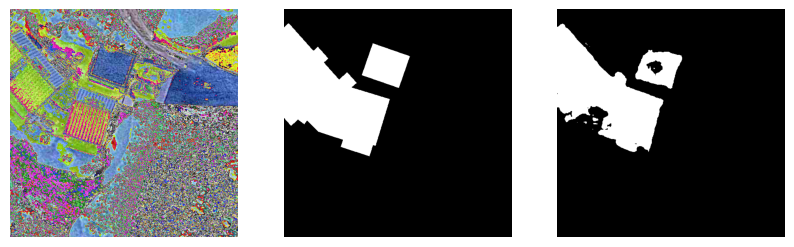

Background: {'iou': 0.9820327758789062, 'precision': 0.9945968985557556, 'recall': 0.9872998595237732, 'f1score': 0.9909349679946899}
Building: {'iou': 0.8936811685562134, 'precision': 0.9228127598762512, 'recall': 0.96588134765625, 'f1score': 0.9438560009002686}


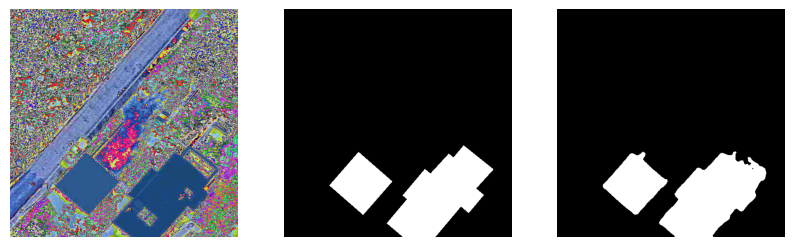

Background: {'iou': 0.9432330131530762, 'precision': 0.9780763983726501, 'recall': 0.9636061191558838, 'f1score': 0.9707873463630676}
Building: {'iou': 0.6681080460548401, 'precision': 0.7623422741889954, 'recall': 0.843869686126709, 'f1score': 0.8010368943214417}


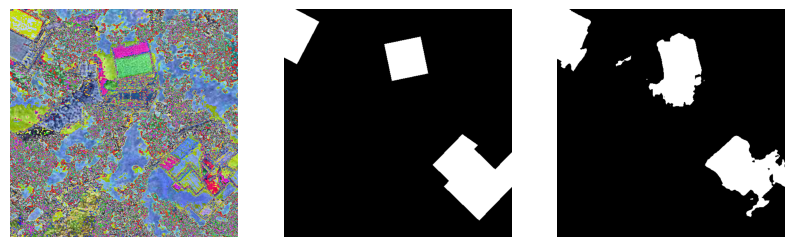

Background: {'iou': 0.9457363486289978, 'precision': 0.949554443359375, 'recall': 0.9957663416862488, 'f1score': 0.9721115231513977}
Building: {'iou': 0.8244494795799255, 'precision': 0.9844669103622437, 'recall': 0.8353155255317688, 'f1score': 0.9037789106369019}


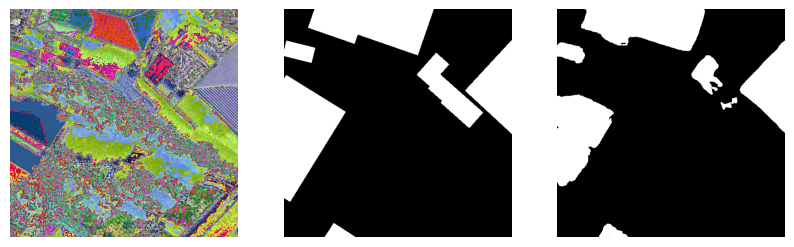

Background: {'iou': 0.9943822026252747, 'precision': 0.9989973306655884, 'recall': 0.9953755736351013, 'f1score': 0.9971832036972046}
Building: {'iou': 0.7964689135551453, 'precision': 0.8263481855392456, 'recall': 0.9565733671188354, 'f1score': 0.8867049217224121}


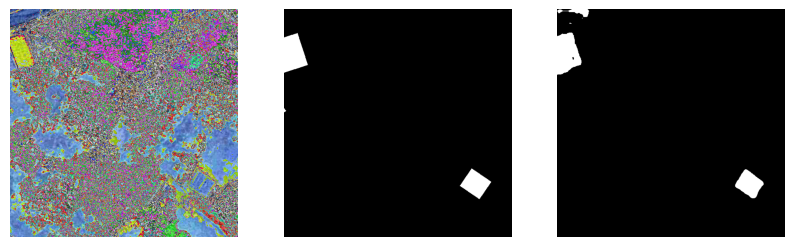

Background: {'iou': 0.9598731994628906, 'precision': 0.9664469361305237, 'recall': 0.9929635524749756, 'f1score': 0.9795258045196533}
Building: {'iou': 0.7630976438522339, 'precision': 0.9500063061714172, 'recall': 0.7950239777565002, 'f1score': 0.8656328916549683}


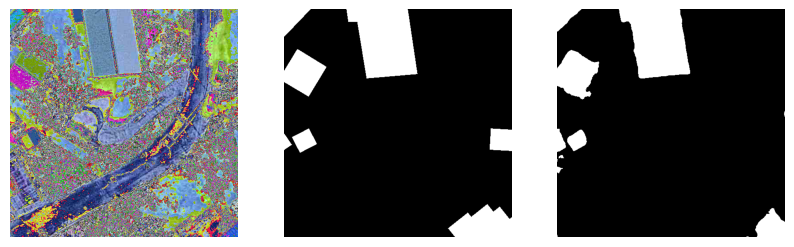

Background: {'iou': 0.9605723023414612, 'precision': 0.9767609238624573, 'recall': 0.9830385446548462, 'f1score': 0.9798896908760071}
Building: {'iou': 0.8577852249145508, 'precision': 0.9348479509353638, 'recall': 0.9123252034187317, 'f1score': 0.9234492778778076}


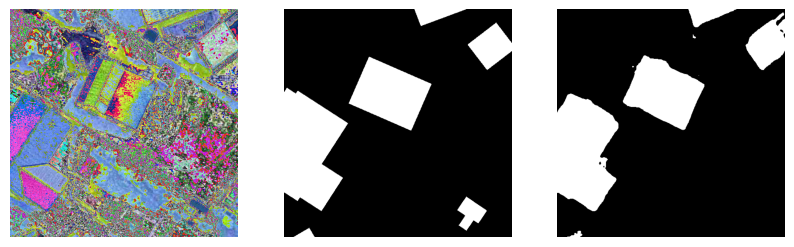

Background: {'iou': 0.9118598103523254, 'precision': 0.9258995056152344, 'recall': 0.9836429953575134, 'f1score': 0.9538981914520264}
Building: {'iou': 0.721514880657196, 'precision': 0.9377332925796509, 'recall': 0.7578217387199402, 'f1score': 0.8382325172424316}


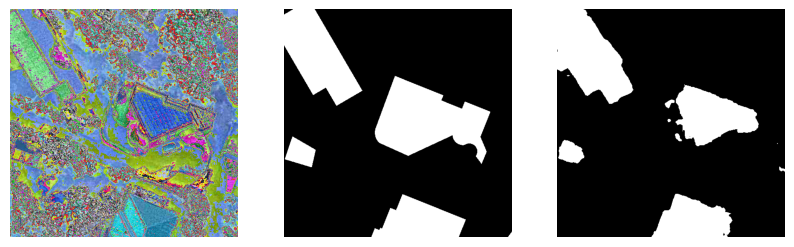

Background: {'iou': 0.9944170713424683, 'precision': 0.9996662735939026, 'recall': 0.9947473406791687, 'f1score': 0.9972007274627686}
Building: {'iou': 0.06037251278758049, 'precision': 0.06394557654857635, 'recall': 0.519336998462677, 'f1score': 0.11387038230895996}


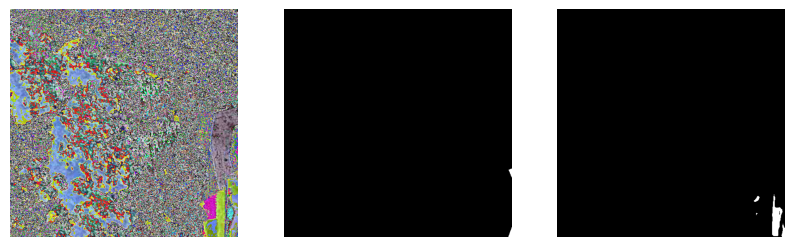

Background: {'iou': 0.9684857130050659, 'precision': 0.9708783626556396, 'recall': 0.9974618554115295, 'f1score': 0.9839906096458435}
Building: {'iou': 0.8198613524436951, 'precision': 0.9831081032752991, 'recall': 0.8315757513046265, 'f1score': 0.9010152220726013}


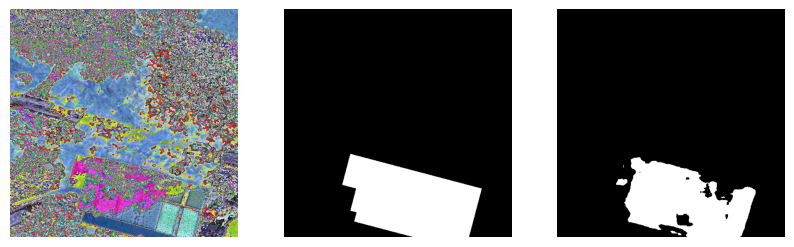

Background: {'iou': 0.9749526381492615, 'precision': 0.9887782335281372, 'recall': 0.98586106300354, 'f1score': 0.9873175024986267}
Building: {'iou': 0.889957070350647, 'precision': 0.9354305863380432, 'recall': 0.9482058882713318, 'f1score': 0.9417749047279358}


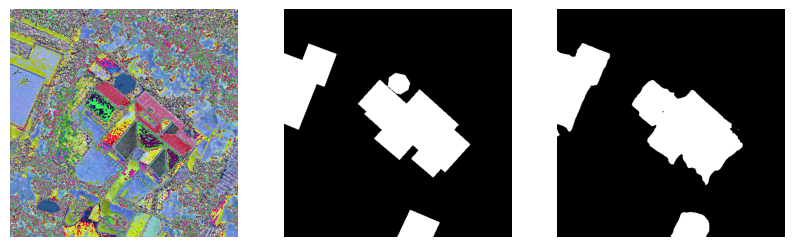

Background: {'iou': 0.9960033893585205, 'precision': 0.9964615702629089, 'recall': 0.9995386004447937, 'f1score': 0.9979977011680603}
Building: {'iou': 0.8830496668815613, 'precision': 0.9849923253059387, 'recall': 0.8950926661491394, 'f1score': 0.9378931522369385}


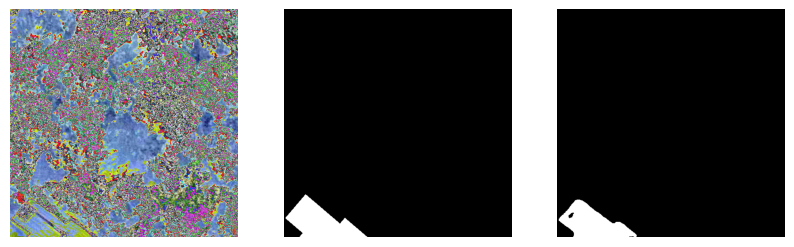

Background: {'iou': 0.9967467188835144, 'precision': 0.9992205500602722, 'recall': 0.9975223541259766, 'f1score': 0.9983707070350647}
Building: {'iou': 0.8120670318603516, 'precision': 0.850257396697998, 'recall': 0.9475880265235901, 'f1score': 0.8962880969047546}


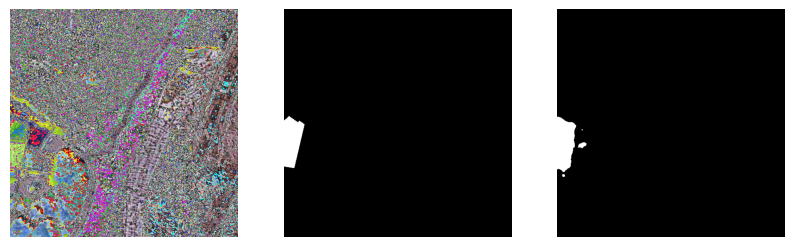

Background: {'iou': 0.999725341796875, 'precision': 0.999725341796875, 'recall': 1.0, 'f1score': 0.9998626708984375}
Building: {'iou': 0.0, 'precision': 1.0, 'recall': 0.0, 'f1score': 0.0}


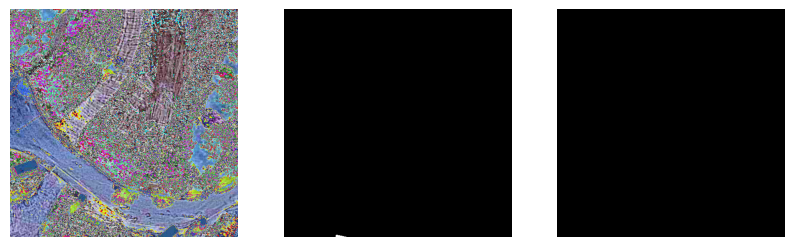

Background: {'iou': 0.99443519115448, 'precision': 0.9994472861289978, 'recall': 0.9949824213981628, 'f1score': 0.9972098469734192}
Building: {'iou': 0.9242709875106812, 'precision': 0.9312405586242676, 'recall': 0.9919676184654236, 'f1score': 0.960645318031311}


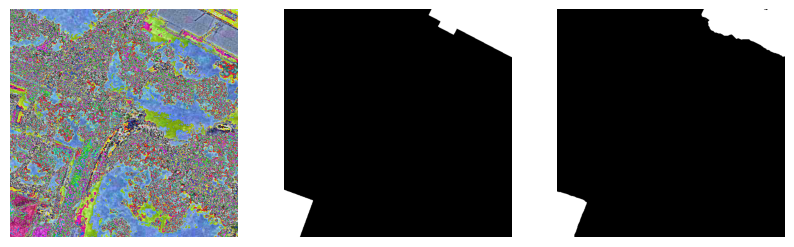

Background: {'iou': 0.9419512748718262, 'precision': 0.950872540473938, 'recall': 0.9901378750801086, 'f1score': 0.9701080322265625}
Building: {'iou': 0.8159839510917664, 'precision': 0.9648327827453613, 'recall': 0.8409966826438904, 'f1score': 0.898668646812439}


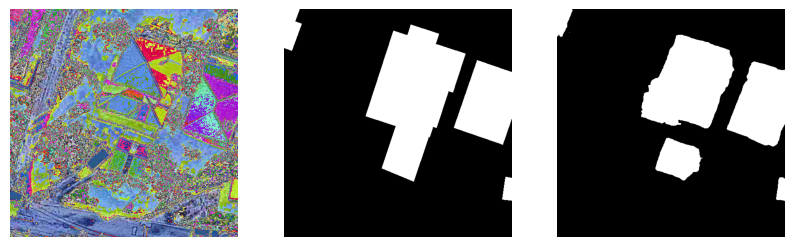

Background: {'iou': 0.9783389568328857, 'precision': 0.9818512201309204, 'recall': 0.9963569045066833, 'f1score': 0.9890508651733398}
Building: {'iou': 0.9157655239105225, 'precision': 0.9850369691848755, 'recall': 0.9286842942237854, 'f1score': 0.9560309052467346}


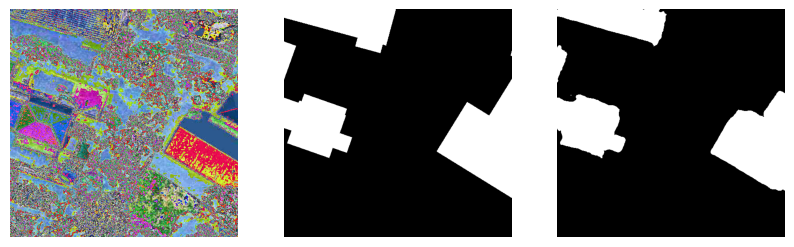

Background: {'iou': 0.9439570903778076, 'precision': 0.957962155342102, 'recall': 0.9847485423088074, 'f1score': 0.9711707234382629}
Building: {'iou': 0.8416251540184021, 'precision': 0.9532079696655273, 'recall': 0.8778949975967407, 'f1score': 0.9140026569366455}


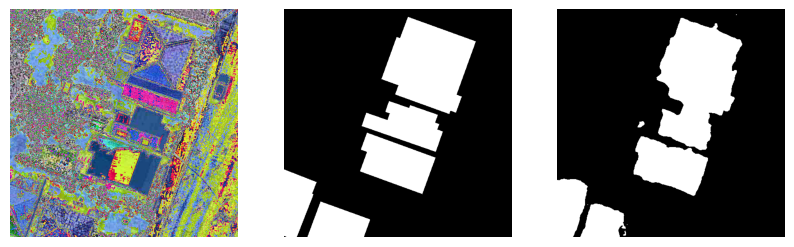

Background: {'iou': 0.9706029295921326, 'precision': 0.970912754535675, 'recall': 0.9996712803840637, 'f1score': 0.98508220911026}
Building: {'iou': 0.7116426825523376, 'precision': 0.9956204295158386, 'recall': 0.7138773798942566, 'f1score': 0.831531822681427}


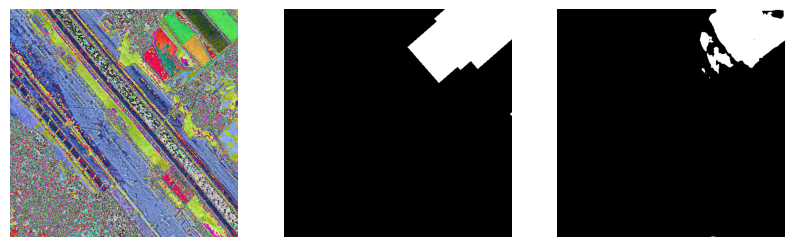

Background: {'iou': 0.9470533728599548, 'precision': 0.9498766660690308, 'recall': 0.9968713521957397, 'f1score': 0.9728068113327026}
Building: {'iou': 0.9567194581031799, 'precision': 0.9974668622016907, 'recall': 0.959049642086029, 'f1score': 0.9778810739517212}


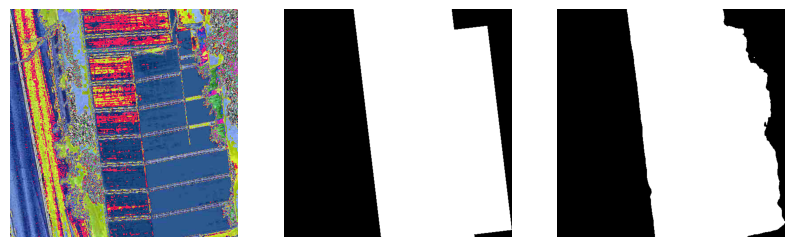

Background: {'iou': 0.9014908671379089, 'precision': 0.9135525822639465, 'recall': 0.9855655431747437, 'f1score': 0.9481937289237976}
Building: {'iou': 0.8725581169128418, 'precision': 0.9808001518249512, 'recall': 0.8877212405204773, 'f1score': 0.931942343711853}


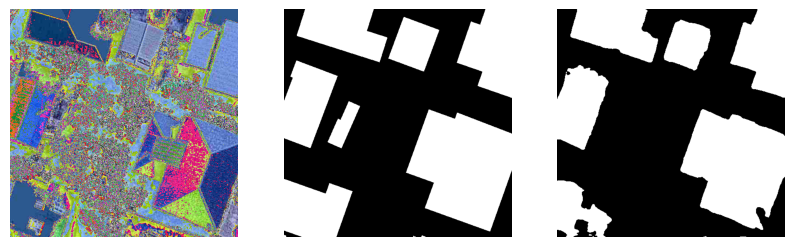

Background: {'iou': 0.992767870426178, 'precision': 0.998180091381073, 'recall': 0.9945680499076843, 'f1score': 0.996370792388916}
Building: {'iou': 0.8677093982696533, 'precision': 0.8974223136901855, 'recall': 0.9632454514503479, 'f1score': 0.9291695952415466}


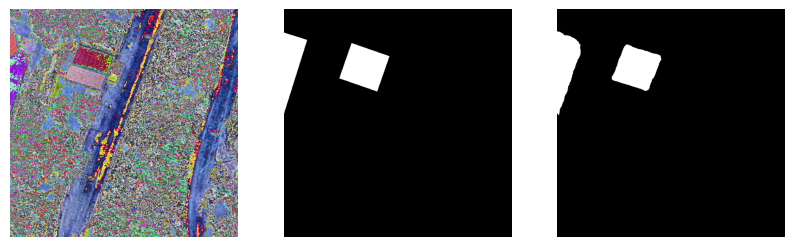

Background: {'iou': 0.976634681224823, 'precision': 0.9974583387374878, 'recall': 0.9790711998939514, 'f1score': 0.9881792664527893}
Building: {'iou': 0.8079148530960083, 'precision': 0.8247890472412109, 'recall': 0.9753024578094482, 'f1score': 0.8937532305717468}


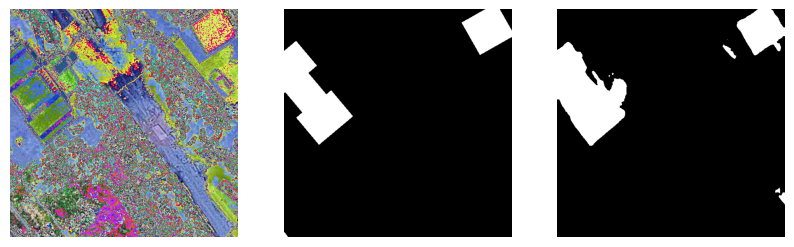

Background: {'iou': 0.971356213092804, 'precision': 0.998026967048645, 'recall': 0.9732251167297363, 'f1score': 0.9854699969291687}
Building: {'iou': 0.5069289803504944, 'precision': 0.5242589712142944, 'recall': 0.9387831687927246, 'f1score': 0.672797441482544}


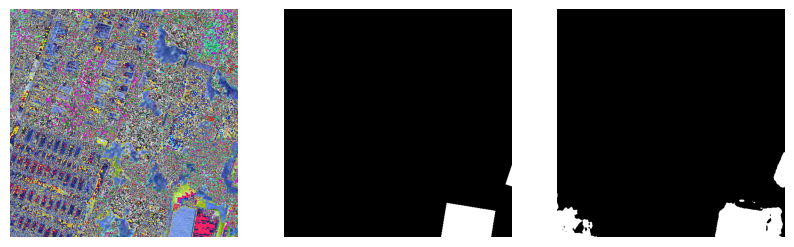

Background: {'iou': 0.9764353036880493, 'precision': 0.9792916178703308, 'recall': 0.9970217943191528, 'f1score': 0.9880771636962891}
Building: {'iou': 0.8742179870605469, 'precision': 0.9825028777122498, 'recall': 0.8880437016487122, 'f1score': 0.9328882694244385}


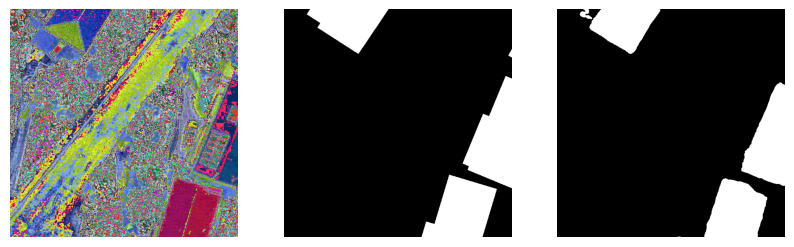

In [12]:
model.eval()
with torch.no_grad():
    for i in range(25):
        X, Y = test_dataset.__getitem__(i)
        X, Y = X.to(DEVICE).unsqueeze(0), Y.to(DEVICE).unsqueeze(0)
        
        pred = model(X)
        
        m = metrics(pred, Y.to(torch.long))
        
        print("=========================================================")
        print(f"Background: {m['background']}")
        print(f"Building: {m['building']}")
        
        _, ax = plt.subplots(1, 3, figsize=(10, 5))
        
        ax[0].imshow(transforms.ToPILImage()(X[0]))
        ax[1].imshow(transforms.ToPILImage()(Y.argmax(dim=1).float()), cmap="gray")
        ax[2].imshow(transforms.ToPILImage()(pred.argmax(dim=1).float()), cmap="gray")
        
        ax[0].axis("off")
        ax[1].axis("off")
        ax[2].axis("off")
        
        plt.show()

In [13]:
running_metrics

{'background': {'iou': 0.9537882667541504,
  'precision': 0.9724467317581177,
  'recall': 0.9793063753128052,
  'f1score': 0.9746214221954346},
 'building': {'iou': 0.8153886829376221,
  'precision': 0.9167896176338196,
  'recall': 0.8721841376781464,
  'f1score': 0.8796379181861878},
 'loss': 0.0025250908656045796}